In [2]:
import scipy.io
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sys import exit
import pandas as pd
import glob
import pickle
from textwrap import wrap
import time
import math
import scipy
from scipy import signal## because scipy doesn't always load its submodules for some reason
from scipy import stats
from sklearn.metrics.cluster import adjusted_rand_score
from copy import deepcopy
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score, pairwise_distances
from scipy.optimize import fsolve
import scipy.optimize
from scipy.stats import levy_stable
import warnings
from sklearn.metrics import pairwise_distances
from scipy.spatial import distance as scipy_spatial_distance
import shared_analysis_functions as shared_func
import importlib
importlib.reload(shared_func)


def get_abundant_and_prevalent_species_idx(otu_abu_t_mat_full):
    prev_cutoff=len(time_points)/2
    abu_cutoff=1e-3
    prev_idx=np.where( np.sum(otu_abu_t_mat_full>0,axis=1) >prev_cutoff )[0]
    abu_idx=np.where( np.mean(otu_abu_t_mat_full,axis=1) >abu_cutoff )[0]
    sp_idx=np.intersect1d(abu_idx,prev_idx)
    return sp_idx

In /Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /User

# load data set from Caporaso,et al;--Ji,..Vitkup

for caporaso data analysis, Ji,..,Vitkup et al 
looked only at species present in more than half the samples and species with abundance > 1e-3
Can the recurrence and return time be systematically affected by this assumption?

In [3]:
# matlab_data_path='/Users/ashish/Documents/GitHub/Macroecological-Relationships_Ji_Dixit_Vitkup/matData/'
matlab_data_path='/Users/ashish/Box/research/James/microbiome data/Ji_dixit_vitkup study/'
output_path='/Users/ashish/Box/research/James/microbiome data/Ji_dixit_vitkup study/'
temp = scipy.io.loadmat(matlab_data_path+'caporaso.mat')
caporaso=deepcopy(temp)
caporaso['f4_rel_abu']=caporaso['f4']/np.sum(caporaso['f4'],axis=0)
caporaso['m3_rel_abu']=caporaso['m3']/np.sum(caporaso['m3'],axis=0)

In [10]:
caporaso.keys()

dict_keys(['__header__', '__version__', '__globals__', 'ctax', 'ctax_conf', 'f4', 'f4_days', 'f4_samples', 'ftax', 'ftax_conf', 'gtax', 'gtax_conf', 'm3', 'm3_days', 'm3_samples', 'otax', 'otax_conf', 'otu_ids', 'ptax', 'ptax_conf', 'tax', 'f4_rel_abu', 'm3_rel_abu'])

In [5]:
np.shape(caporaso['f4'])

(2982, 131)

In [6]:
np.shape(np.sum(caporaso['f4'],axis=0))

(131,)

In [8]:
np.shape(caporaso['m3'])

(2982, 336)

In [9]:
np.shape(caporaso['gtax'])

(2982, 1)

In [7]:
caporaso['gtax']

array([[array(['Bacteroides'], dtype='<U11')],
       [array(['Bacteroides'], dtype='<U11')],
       [array(['Bacteroides'], dtype='<U11')],
       ...,
       [array(['Sporobacter'], dtype='<U11')],
       [array(['Pseudobutyrivibrio'], dtype='<U18')],
       [array(['Acetanaerobacterium'], dtype='<U19')]], dtype=object)

In [6]:
caporaso['tax']

array([[array(['Root; 100%; Bacteria; 100%; Bacteroidetes; 100%; Bacteroidia; 100%; Bacteroidales; 100%; Bacteroidaceae; 100%; Bacteroides; 100%'],
              dtype='<U128')                                                                                                                       ],
       [array(['Root; 100%; Bacteria; 100%; Bacteroidetes; 100%; Bacteroidia; 100%; Bacteroidales; 100%; Bacteroidaceae; 100%; Bacteroides; 100%'],
              dtype='<U128')                                                                                                                       ],
       [array(['Root; 100%; Bacteria; 100%; Bacteroidetes; 100%; Bacteroidia; 100%; Bacteroidales; 100%; Bacteroidaceae; 100%; Bacteroides; 100%'],
              dtype='<U128')                                                                                                                       ],
       ...,
       [array(['Root; 100%; Bacteria; 100%; Firmicutes; 79%; Clostridia; 68%; Clostridiales; 6

# plot of log g distribution
-abundance cutoff is 1e-3 on integers??

In [4]:

def plot_log_growth_dist(otu_abu_t_mat_full, time_points, tau):
    ## find prevalent species and abundant species.
#     prev_cutoff=len(time_points)/2
#     abu_cutoff=1e-3
#     prev_idx=np.where( np.sum(otu_abu_t_mat_full>0,axis=1) >prev_cutoff )[0]
#     abu_idx=np.where( np.mean(otu_abu_t_mat_full,axis=1) >abu_cutoff )[0]
#     sp_idx=np.intersect1d(abu_idx,prev_idx)
#     otu_abu_t_mat=otu_abu_t_mat_full[sp_idx]
    ## find prevalent species and abundant species.
    sp_idx=get_abundant_and_prevalent_species_idx(otu_abu_t_mat_full)
    otu_abu_t_mat=otu_abu_t_mat_full[sp_idx]
    
    
    AIC_dict={'laplace':[], 'NeutralTheory':[],'weibull_MLE':[],}
    fit_values_dict={'laplace':[], 'NeutralTheory':[],'weibull_MLE':[]}
    ## find time stampindexes that are one data apart
    idx_1_list=[]
    idx_2_list=[]
    for j,t2 in enumerate(time_points):
        if np.any(time_points==t2-tau):
            i=int(np.where(time_points==t2-tau)[0])
            t1=time_points[i]
    #         print (i,j, t1, t2)
            idx_1_list.append(i)
            idx_2_list.append(j)
    idxs_1=np.array(idx_1_list)
    idxs_2=np.array(idx_2_list)
    print (len(idxs_1))
    otu_t2=np.ravel(otu_abu_t_mat[:,idxs_2])
    otu_t1=np.ravel(otu_abu_t_mat[:,idxs_1])
    idx_non0=np.intersect1d(np.nonzero(otu_t2), np.nonzero(otu_t1))
    
    # idx_nonzero=np.intersect1d(np.nonzer)
    growth_rates=otu_t2[idx_non0]/otu_t1[idx_non0]
    log_g=np.log(growth_rates)
    mu_laplace, scale_laplace=scipy.stats.laplace.fit(log_g,floc=0,scale=.2)
    
    neutral_inst = shared_func.azaele_neutral_logG_distribution()
    neut_tp, neut_bd, loc_neut, scale_neut = neutral_inst.fit(
        log_g,10., 1., floc=0,fscale=1.) ## scale and loc can be fixed because 2 parameters are tp and bd
    weibull_inst = shared_func.symmetric_weibull_gen() 
#     weibull_k_MLE, loc_weibull , weibull_lambda_MLE=  weibull_inst.fit(
#          log_g, 1.1, scale=.005, floc=0)
    
    n_bins=31
    histogram, bins = np.histogram(log_g, bins=n_bins, density=True)
    bin_centers = 0.5*(bins[1:] + bins[:-1])
    
    logLik = np.sum( stats.laplace.logpdf(log_g, loc=0,scale= scale_laplace ) ) 
    AIC_dict['laplace'].append(2*1-2*logLik)
    
    temp=neutral_inst.logpdf(log_g, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut)
    logLik = np.sum(temp) 
    AIC_dict['NeutralTheory'].append(2*2-2*logLik)
    
#     temp=weibull_inst.logpdf(log_g, weibull_k_MLE, loc=0,scale= weibull_lambda_MLE )
#     logLik = np.sum(temp)
#     AIC_dict['weibull_MLE'].append(2*2-2*logLik)
        
    fit_values_dict['laplace'].append(np.array([mu_laplace,scale_laplace]))
    fit_values_dict['NeutralTheory'].append(np.array([neut_tp,neut_bd,loc_neut,scale_neut]))
    #     fit_values_dict['weibull_MLE'].append(np.array([weibull_k_MLE, loc_weibull, weibull_lambda_MLE]))
    
    fig = plt.figure(figsize=(6, 6))
    ax1 = fig.add_subplot()
    # ax2 = fig.add_subplot(1,2,2)

    ax1.hist(log_g, bins=n_bins, density=True)
    ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu_laplace,scale=scale_laplace),
                     'c-',lw=3,label='Laplace')
    ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut),
             'r-',lw=3,label='BDI model') 
    
    ax1.legend(loc='best')
    ax1.set_yscale('log')
    ax1.set_xlabel('log of growth rates')                                                 
    plt.show()
    
    print ('AIC laplace- AIC neutral=  ', AIC_dict['laplace'][0]-AIC_dict['NeutralTheory'][0] )
    print (AIC_dict)
    print (fit_values_dict)
    


'' warning in netural theory is:
'''/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]'''
  

for female f4 with tau =1, 4

for relative abundance
tau= 1
114


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


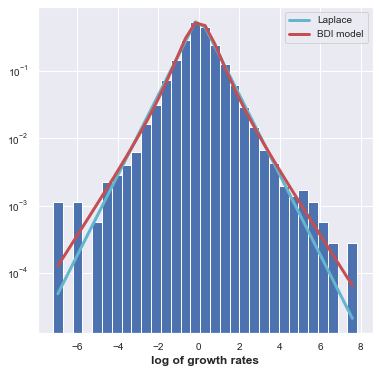

AIC laplace- AIC neutral=   1.4161696102491987
{'laplace': [20115.249990814653], 'NeutralTheory': [20113.833821204404], 'weibull_MLE': []}
{'laplace': [array([0.        , 0.73009319])], 'NeutralTheory': [array([0.26251951, 1.08339205, 0.        , 1.        ])], 'weibull_MLE': []}
tau= 4
98


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


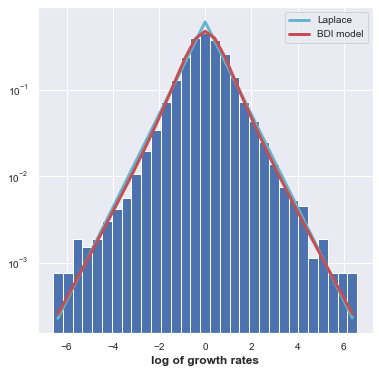

AIC laplace- AIC neutral=   88.89706922193
{'laplace': [18450.044808695107], 'NeutralTheory': [18361.147739473177], 'weibull_MLE': []}
{'laplace': [array([0.        , 0.80716478])], 'NeutralTheory': [array([0.38071662, 1.13519194, 0.        , 1.        ])], 'weibull_MLE': []}


In [9]:
time_points=np.squeeze(caporaso['f4_days'])
print('for relative abundance')
rel_abu_t_mat_full=caporaso['f4_rel_abu']
tau=1
print ('tau=', tau)
plot_log_growth_dist(rel_abu_t_mat_full, time_points, tau)


tau=4
print ('tau=', tau)
plot_log_growth_dist(rel_abu_t_mat_full, time_points, tau)

for male M3 tau=1, tau =4

tau= 1
277


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


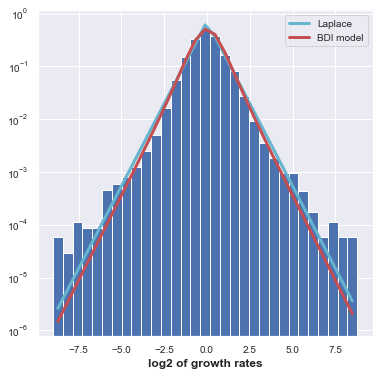

AIC laplace- AIC neutral=   -916.960082823527
{'gaussian': [], 'laplace': [160654.13784583172], 'weibull_MLE': [], 'NeutralTheory': [161571.09792865525]}
{'laplace': [array([0.        , 0.69569152])], 'weibull_MLE': [], 'NeutralTheory': [array([0.46553832, 1.47533649, 0.        , 1.        ])], 'gaussian': []}
for relative abundance
tau= 1
277


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


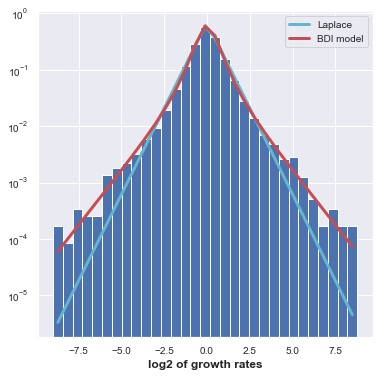

AIC laplace- AIC neutral=   237.7834947859301
{'gaussian': [], 'laplace': [55473.165148707], 'weibull_MLE': [], 'NeutralTheory': [55235.38165392107]}
{'laplace': [array([0.        , 0.71032167])], 'weibull_MLE': [], 'NeutralTheory': [array([0.15325447, 0.89057621, 0.        , 1.        ])], 'gaussian': []}
tau= 4
268


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


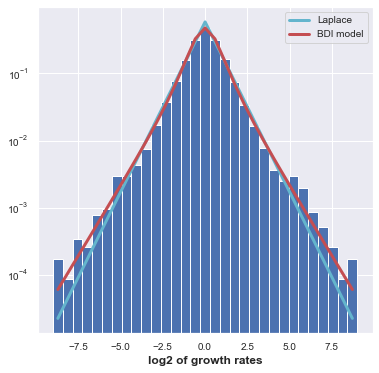

AIC laplace- AIC neutral=   87.70794100814237
{'gaussian': [], 'laplace': [61224.74177108165], 'weibull_MLE': [], 'NeutralTheory': [61137.03383007351]}
{'laplace': [array([0.        , 0.85823706])], 'weibull_MLE': [], 'NeutralTheory': [array([0.30573833, 0.95729059, 0.        , 1.        ])], 'gaussian': []}


In [23]:
count_data=caporaso['m3']
time_points=np.squeeze(caporaso['m3_days'])
tau=1
print ('tau=', tau)
otu_abu_t_mat_full=caporaso['m3']
plot_log_growth_dist(otu_abu_t_mat_full, time_points, tau)
# tau=4
# print ('tau=', tau)
# plot_log_growth_dist(otu_abu_t_mat_full, time_points,tau)

print('for relative abundance')
rel_abu_t_mat_full=caporaso['m3_rel_abu']
tau=1
print ('tau=', tau)
plot_log_growth_dist(rel_abu_t_mat_full, time_points, tau)

tau=4
print ('tau=', tau)
plot_log_growth_dist(rel_abu_t_mat_full, time_points, tau)


# AFD of data

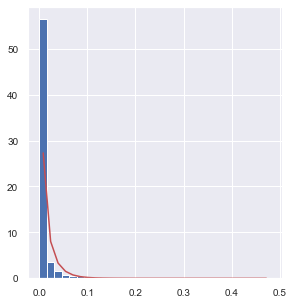

In [10]:
rel_abu_t_mat_full=caporaso['m3_rel_abu']
time_points=np.squeeze(caporaso['m3_days'])
sp_idx=get_abundant_and_prevalent_species_idx(rel_abu_t_mat_full)
rel_abu_t_mat=rel_abu_t_mat_full[sp_idx]   

rel_abu=np.ravel(rel_abu_t_mat)
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(1,2,1)
a_gamma,dummy_loc_gamma, scale_gamma=scipy.stats.gamma.fit(
                            rel_abu[np.nonzero(rel_abu)], 1.,floc=0.,scale=2 )

    
n_bins=31
histogram, bins = np.histogram(rel_abu, bins=n_bins, density=True)
bin_centers = 0.5*(bins[1:] + bins[:-1])
ax1.hist(rel_abu, bins=n_bins, density=True)


ax1.plot(bin_centers,scipy.stats.gamma.pdf(bin_centers, a_gamma,
                                           loc=0, scale= scale_gamma), 
                 'r-',label='Gamma-BDI')


In [5]:

def plot_AFD_gamma_params(otu_abu_t_mat_full, time_points):
    ## find prevalent species and abundant species.
    sp_idx=get_abundant_and_prevalent_species_idx(otu_abu_t_mat_full)
    otu_abu_t_mat=otu_abu_t_mat_full[sp_idx]    
    k_vals=[]
    theta_vals=[]
    for sp in range(len(otu_abu_t_mat)):
#         a_gamma,dummy_loc_gamma, scale_gamma=scipy.stats.gamma.fit(
#                             np.ravel(otu_abu_t_mat[sp]), 1.,floc=0.,scale=np.var(emp_time) )
           
        temp=otu_abu_t_mat[sp]
        a_gamma,dummy_loc_gamma, scale_gamma=scipy.stats.gamma.fit(
                            temp[np.nonzero(temp)], 1.,floc=0.,scale=2 )
        
        k_vals.append(a_gamma)
        theta_vals.append(scale_gamma)
        
    ## find time stampindexes that are one data apart
    fig = plt.figure(figsize=(10, 5))
    ax1 = fig.add_subplot(1,2,1)
    ax2 = fig.add_subplot(1,2,2)
    ax1.hist(np.array(k_vals), log=True)
    
#     ax1.hist(np.array(k_vals), bins=np.logspace(np.log10(np.min(k_vals)),
#                                                 np.log10(np.max(k_vals)), 10))
#     ax1.set_xscale("log")
    
    
    ax1.set_xlabel(r'shape of gamma, $k$')

    ax2.hist(np.array(theta_vals), log=True)
    ax2.set_xlabel(r'scale of gamma $\theta$')
    plt.show()
    
    k_array=np.zeros(len(otu_abu_t_mat_full))
    theta_array=np.zeros(len(otu_abu_t_mat_full))
    k_array[sp_idx]=np.array(k_vals)
    theta_array[sp_idx]=np.array(theta_vals)
    
    results_dict={'shape_gamma_k':k_array, 'scale_gamma_theta':theta_array,
                 'species_fittd':sp_idx}
    return results_dict


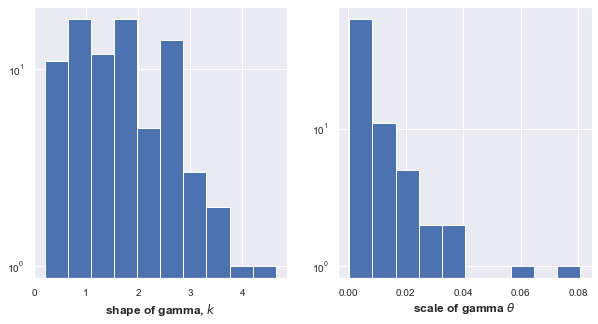

In [64]:
time_points=np.squeeze(caporaso['m3_days'])
rel_abu_t_mat_full=caporaso['m3_rel_abu']
results_dict=plot_AFD_gamma_params(rel_abu_t_mat_full, time_points)
caporaso['m3_shape_gamma_k']=results_dict['shape_gamma_k']
caporaso['m3_scale_gamma_theta']=results_dict['scale_gamma_theta']

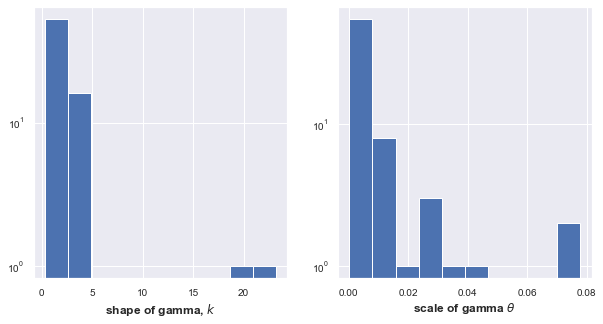

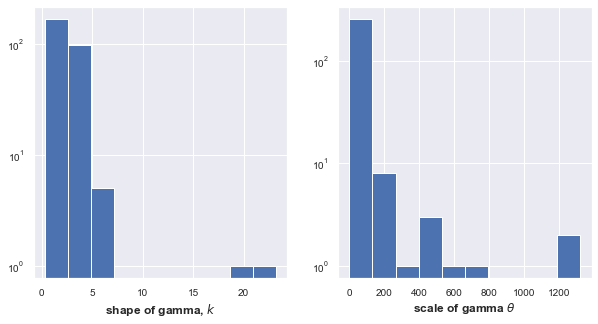

In [50]:
rel_abu_t_mat_full=caporaso['f4_rel_abu']
results_dict=plot_AFD_gamma_params(rel_abu_t_mat_full, time_points)
caporaso['f4_shape_gamma_k']=results_dict['shape_gamma_k']
caporaso['f4_scale_gamma_theta']=results_dict['scale_gamma_theta']

time_points=np.squeeze(caporaso['f4_days'])
otu_abu_t_mat_full=caporaso['f4']
_=plot_AFD_gamma_params(otu_abu_t_mat_full, time_points)

In [51]:
np.nonzero(caporaso['f4_shape_gamma_k'])

(array([   0,    1,    2,    3,    4,    5,    6,    9,   10,   11,   13,
          15,   16,   17,   18,   23,   24,   26,   28,   31,   33,   34,
          36,   38,   39,   42,   43,   47,   51,   52,   53,   54,   57,
          60,   61,   62,   67,   69,   74,   79,   81,   89,   93,   95,
          96,   98,  103,  105,  107,  109,  125,  145,  186,  189,  209,
         227,  237,  328,  330,  345,  428,  474,  481,  733,  881, 1210,
        1310, 2010, 2158, 2629, 2878]),)

In [52]:
np.nonzero(caporaso['m3_shape_gamma_k'])

(array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
          11,   12,   13,   14,   15,   16,   17,   18,   19,   20,   21,
          22,   23,   24,   26,   28,   29,   30,   31,   33,   34,   35,
          36,   38,   39,   40,   41,   42,   43,   45,   47,   48,   49,
          50,   51,   53,   54,   55,   57,   58,   60,   61,   62,   64,
          65,   66,   67,   70,   72,   74,   75,   77,   79,   80,   82,
          86,   87,   96,  145,  186,  189,  207,  208,  227,  328,  345,
         428,  481,  733,  881, 1036, 1466, 1820, 2010]),)

# plot log_g dist for species with similar k

In [68]:
shapes=caporaso['m3_shape_gamma_k']
print(np.sort(shapes[np.nonzero(shapes)]))

[0.21002438 0.24885092 0.2920717  0.30685105 0.31350518 0.32346149
 0.3350827  0.35953369 0.48738169 0.61114212 0.6253137  0.7062495
 0.73155077 0.76433378 0.80204833 0.80791728 0.81775754 0.82814616
 0.86647717 0.90876255 0.91458305 0.91984572 0.95848509 0.96439904
 0.97529346 0.98286135 0.98479729 1.01918697 1.04810152 1.1763815
 1.18346146 1.19894002 1.23741069 1.2418285  1.31402312 1.35325598
 1.35442856 1.36592034 1.39835026 1.48282495 1.50862318 1.5449698
 1.56896216 1.58001036 1.63811789 1.71870149 1.72158426 1.73431161
 1.74482145 1.75719708 1.76708612 1.76881989 1.77844204 1.79476448
 1.79584476 1.84517094 1.87230505 1.94532667 1.96390267 2.06110282
 2.06606306 2.15541545 2.21929866 2.35557504 2.47440849 2.54389075
 2.57614527 2.57672269 2.6360275  2.66108557 2.66846772 2.70681318
 2.72381644 2.74097781 2.79327886 2.81730381 2.8324462  2.83576133
 3.11207799 3.11723773 3.22023127 3.37547062 3.54440438 3.82597908
 4.63932036]


268


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


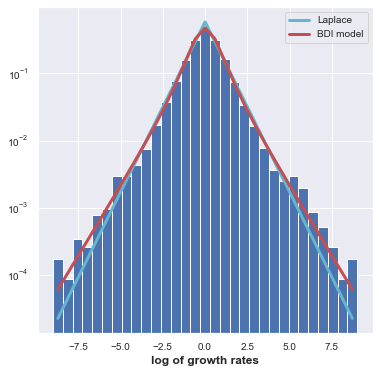

AIC laplace- AIC neutral=   87.70794100814237
{'laplace': [61224.74177108165], 'NeutralTheory': [61137.03383007351], 'weibull_MLE': []}
{'laplace': [array([0.        , 0.85823706])], 'NeutralTheory': [array([0.30573833, 0.95729059, 0.        , 1.        ])], 'weibull_MLE': []}


In [86]:
### without any subsetting:
plot_log_growth_dist(caporaso['m3_rel_abu'], time_points, tau)

for shape, k between .1 and 1

tau= 1
277


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


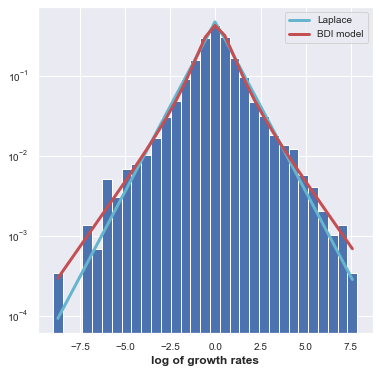

AIC laplace- AIC neutral=   2.8095764283025346
{'laplace': [18488.864883948478], 'NeutralTheory': [18486.055307520175], 'weibull_MLE': []}
{'laplace': [array([0.        , 1.01683996])], 'NeutralTheory': [array([0.26137077, 0.74471612, 0.        , 1.        ])], 'weibull_MLE': []}
tau= 4
268


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


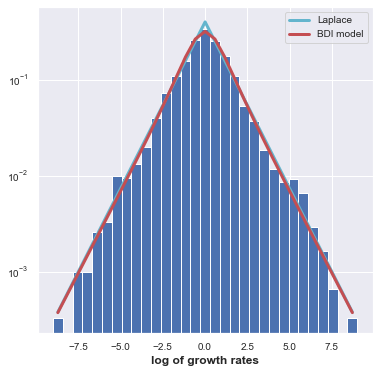

AIC laplace- AIC neutral=   -3.395770973427716
{'laplace': [19993.335344459425], 'NeutralTheory': [19996.731115432853], 'weibull_MLE': []}
{'laplace': [array([0.        , 1.25421822])], 'NeutralTheory': [array([0.60586378, 0.78105127, 0.        , 1.        ])], 'weibull_MLE': []}


In [87]:
sp_idxs2=np.squeeze(np.where(caporaso['m3_shape_gamma_k']>.1))
sp_idxs1=np.squeeze(np.where(caporaso['m3_shape_gamma_k']<1))

sp_idxs=np.intersect1d(sp_idxs1,sp_idxs2)


tau=1
print('tau=',tau)
plot_log_growth_dist(caporaso['m3_rel_abu'][sp_idxs], time_points, tau)

tau=4
print('tau=',tau)
plot_log_growth_dist(caporaso['m3_rel_abu'][sp_idxs], time_points, tau)



for shape, k between 1 and 2 

tau= 1
277


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


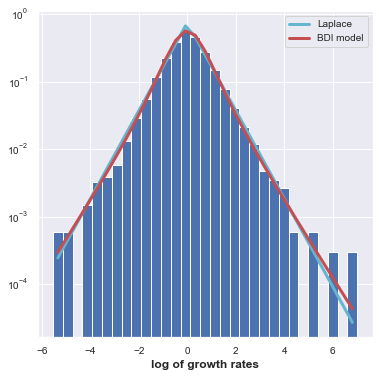

AIC laplace- AIC neutral=   24.509303414364695
{'laplace': [21469.780493427494], 'NeutralTheory': [21445.27119001313], 'weibull_MLE': []}
{'laplace': [array([0.        , 0.66500603])], 'NeutralTheory': [array([0.30836759, 1.30970613, 0.        , 1.        ])], 'weibull_MLE': []}
tau= 4
268


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


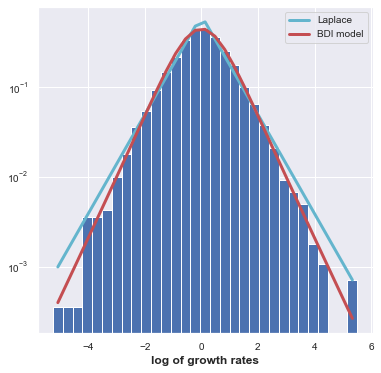

AIC laplace- AIC neutral=   160.66467868277687
{'laplace': [23488.663608733805], 'NeutralTheory': [23327.998930051028], 'weibull_MLE': []}
{'laplace': [array([0.        , 0.78511913])], 'NeutralTheory': [array([0.71504066, 1.53848766, 0.        , 1.        ])], 'weibull_MLE': []}


In [88]:
sp_idxs2=np.squeeze(np.where(caporaso['m3_shape_gamma_k']>1))
sp_idxs1=np.squeeze(np.where(caporaso['m3_shape_gamma_k']<2))

sp_idxs=np.intersect1d(sp_idxs1,sp_idxs2)


tau=1
print('tau=',tau)
plot_log_growth_dist(caporaso['m3_rel_abu'][sp_idxs], time_points, tau)

tau=4
print('tau=',tau)
plot_log_growth_dist(caporaso['m3_rel_abu'][sp_idxs], time_points, tau)



for shape between 2 and 3

tau= 1
277


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


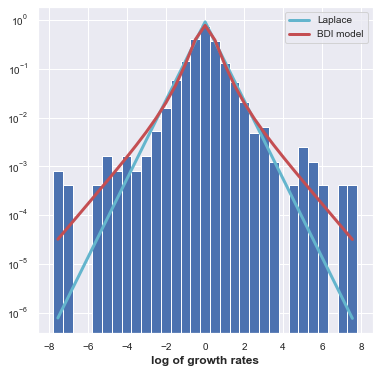

AIC laplace- AIC neutral=   85.85225054469993
{'laplace': [10489.911810892987], 'NeutralTheory': [10404.059560348287], 'weibull_MLE': []}
{'laplace': [array([0.        , 0.53919148])], 'NeutralTheory': [array([0.11983458, 1.08072839, 0.        , 1.        ])], 'weibull_MLE': []}
tau= 4
268


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


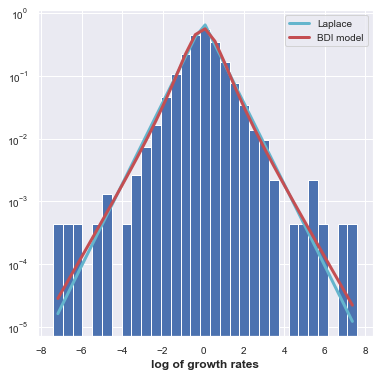

AIC laplace- AIC neutral=   43.49288033472294
{'laplace': [12210.63967633168], 'NeutralTheory': [12167.146795996958], 'weibull_MLE': []}
{'laplace': [array([0.        , 0.66676609])], 'NeutralTheory': [array([0.30295163, 1.29907879, 0.        , 1.        ])], 'weibull_MLE': []}


In [89]:
sp_idxs2=np.squeeze(np.where(caporaso['m3_shape_gamma_k']>2))
sp_idxs1=np.squeeze(np.where(caporaso['m3_shape_gamma_k']<3))

sp_idxs=np.intersect1d(sp_idxs1,sp_idxs2)

tau=1
print('tau=',tau)
plot_log_growth_dist(caporaso['m3_rel_abu'][sp_idxs], time_points, tau)

tau=4
print('tau=',tau)
plot_log_growth_dist(caporaso['m3_rel_abu'][sp_idxs], time_points, tau)



could it be that the few large fluctuations cause the inferred shape to change a lot?

### could rare fluctuations change inferred k when k is betwee 2 and 3?
- compare a manual guess parameter, with k in(2,3) to the MLE fit which infers a k of about 1.3

tau= 1
277


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


 neut_tp, neut_bd= 0.11983457625404581 1.0807283896037183


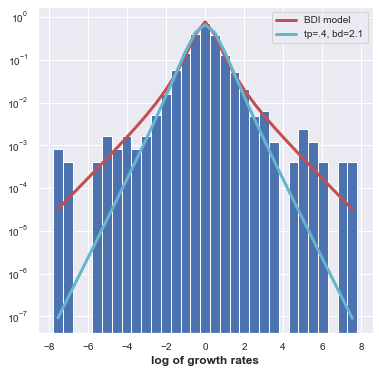

In [105]:
sp_idxs2=np.squeeze(np.where(caporaso['m3_shape_gamma_k']>2))
sp_idxs1=np.squeeze(np.where(caporaso['m3_shape_gamma_k']<3))

sp_idxs=np.intersect1d(sp_idxs1,sp_idxs2)
tau=1
print('tau=',tau)
# tau=1
# print('tau=',tau)
# plot_log_growth_dist(caporaso['m3_rel_abu'][sp_idxs], time_points, tau)
# plot_log_growth_dist(caporaso['m3_rel_abu'][sp_idxs], time_points, tau)
data_mat=caporaso['m3_rel_abu'][sp_idxs]
sp_idx=get_abundant_and_prevalent_species_idx(data_mat)
otu_abu_t_mat=data_mat[sp_idx]

## find time stampindexes that are one data apart
idx_1_list=[]
idx_2_list=[]
for j,t2 in enumerate(time_points):
    if np.any(time_points==t2-tau):
        i=int(np.where(time_points==t2-tau)[0])
        t1=time_points[i]
#         print (i,j, t1, t2)
        idx_1_list.append(i)
        idx_2_list.append(j)
idxs_1=np.array(idx_1_list)
idxs_2=np.array(idx_2_list)
print (len(idxs_1))
otu_t2=np.ravel(otu_abu_t_mat[:,idxs_2])
otu_t1=np.ravel(otu_abu_t_mat[:,idxs_1])
idx_non0=np.intersect1d(np.nonzero(otu_t2), np.nonzero(otu_t1))

# idx_nonzero=np.intersect1d(np.nonzer)
growth_rates=otu_t2[idx_non0]/otu_t1[idx_non0]
log_g=np.log(growth_rates)

neutral_inst = shared_func.azaele_neutral_logG_distribution()
neut_tp, neut_bd, loc_neut, scale_neut = neutral_inst.fit(
    log_g,10., 1., floc=0,fscale=1.) 


print (' neut_tp, neut_bd=',  neut_tp, neut_bd)
fig = plt.figure(figsize=(6, 6))
ax1 = fig.add_subplot()

n_bins=31
histogram, bins = np.histogram(log_g, bins=n_bins, density=True)
bin_centers = 0.5*(bins[1:] + bins[:-1])


ax1.hist(log_g, bins=n_bins, density=True)
# ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu_laplace,scale=scale_laplace),
#                  'c-',lw=3,label='Laplace')
ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut),
         'r-',lw=3,label='BDI model') 

ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, 0.4, 2.1, loc=loc_neut,scale= scale_neut),
         'c-',lw=3,label='tp=.4, bd=2.1') 


ax1.legend(loc='best')
ax1.set_yscale('log')
ax1.set_xlabel('log of growth rates')                                                 
plt.show()


In [79]:
np.shape(caporaso['m3_rel_abu'][sp_idxs])

(32, 336)

In [75]:
len(sp_idxs)

32

# simultaneous fit of AFD and log_g distribution

fitting logG with shape from AFD seems to work a little better visually than the other way around..

## fit AFD with logG shape
not as great as thre reverse, so we don't do this much.

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

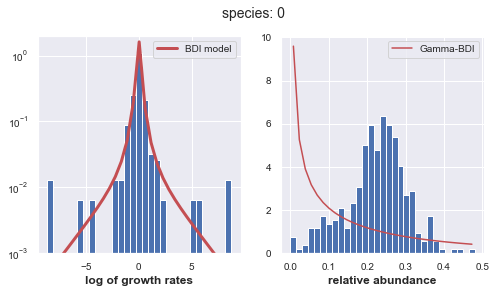

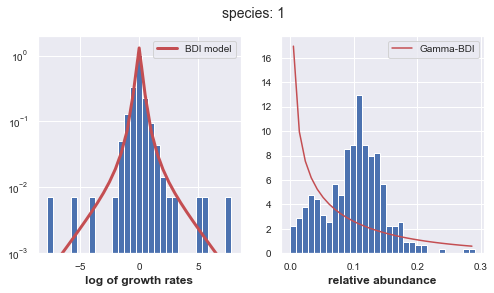

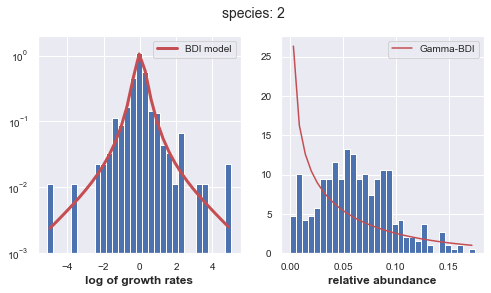

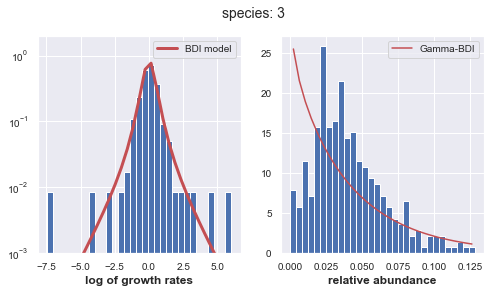

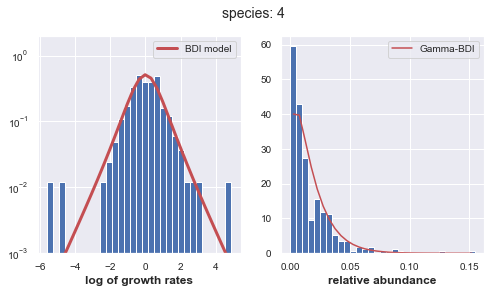

...

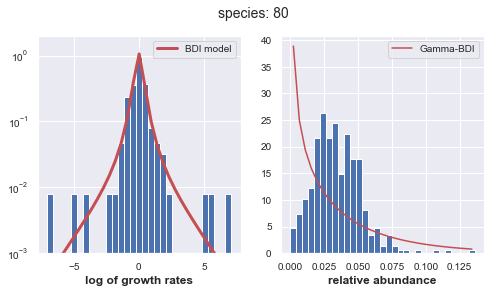

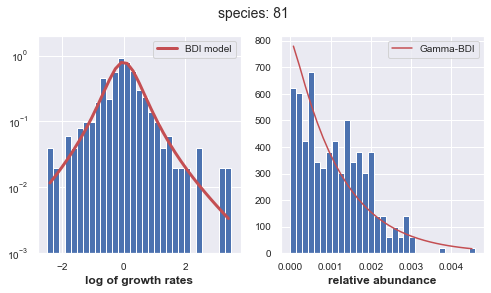

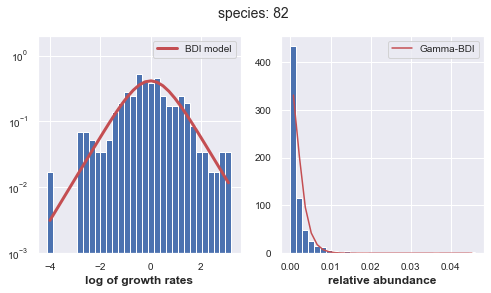

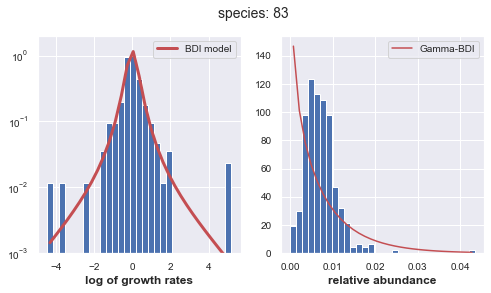

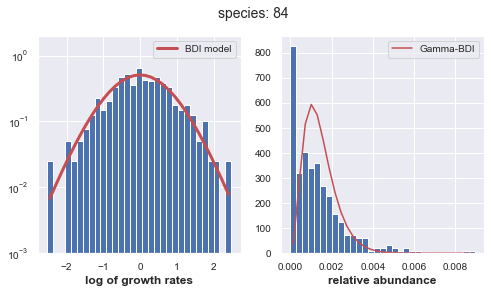

In [9]:
destfold='/Users/ashish/Box/research/James/microbiome data/microbiome_fits/'    
neutral_inst = shared_func.azaele_neutral_logG_distribution()
time_points=np.squeeze(caporaso['m3_days'])
rel_abu_t_mat_full=caporaso['m3_rel_abu']

sp_idxs=get_abundant_and_prevalent_species_idx(rel_abu_t_mat_full)
otu_abu_t_mat=rel_abu_t_mat_full[sp_idxs]

tau=1
idx_1_list=[]
idx_2_list=[]
for j,t2 in enumerate(time_points):
    if np.any(time_points==t2-tau):
        i=int(np.where(time_points==t2-tau)[0])
        t1=time_points[i]
#         print (i,j, t1, t2)
        idx_1_list.append(i)
        idx_2_list.append(j)
idxs_1=np.array(idx_1_list)
idxs_2=np.array(idx_2_list)
# print (len(idxs_1))
# otu_t2=np.ravel(otu_abu_t_mat[:,idxs_2])
# otu_t1=np.ravel(otu_abu_t_mat[:,idxs_1])


# idx_nonzero=np.intersect1d(np.nonzer)

results_fit={'m/D_logG':[],'tau':[], 'Dtau':[]}   

for sp in range(len(otu_abu_t_mat)):
    
    otu_t2=np.ravel(otu_abu_t_mat[sp,idxs_2])
    otu_t1=np.ravel(otu_abu_t_mat[sp,idxs_1])
    idx_non0=np.intersect1d(np.nonzero(otu_t2), np.nonzero(otu_t1))
    growth_rates=otu_t2[idx_non0]/otu_t1[idx_non0]
    log_g=np.log(growth_rates)
    
    
    
    neut_tp, neut_bd, loc_neut, scale_neut = neutral_inst.fit(
        log_g,10., 1., floc=0,fscale=1.)
    
    otu_abu=otu_abu_t_mat[sp,:]
    a_gamma,dummy_loc_gamma, scale_gamma=scipy.stats.gamma.fit(
                            otu_abu[otu_abu>0], fa=neut_bd,floc=0.,scale=2 )
    
    results_fit['m/D_logG'].append(a_gamma)
    results_fit['tau'].append(neut_tp)
    results_fit['Dtau'].append(scale_gamma)
    
    
    fig = plt.figure(figsize=(8, 4))
    ax1 = fig.add_subplot(1,2,1)
    

    n_bins=31
    histogram, bins = np.histogram(log_g, bins=n_bins, density=True)
    bin_centers = 0.5*(bins[1:] + bins[:-1])
    ax1.hist(log_g, bins=n_bins, density=True)
#     ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu_laplace,scale=scale_laplace),
#                      'c-',lw=3,label='Laplace')
    ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut),
             'r-',lw=3,label='BDI model') 
    
    ax1.legend(loc='best')
    ax1.set_yscale('log')
    ax1.set_xlabel('log of growth rates')   
    ax1.set_ylim(1e-3,2.)
    
    ax2 = fig.add_subplot(1,2,2)

    n_bins=31
    histogram, bins = np.histogram(otu_abu, bins=n_bins, density=True)
    bin_centers = 0.5*(bins[1:] + bins[:-1])
    ax2.hist(otu_abu, bins=n_bins, density=True)
    

    ax2.plot(bin_centers,scipy.stats.gamma.pdf(bin_centers, a_gamma,
                                               loc=0, scale= scale_gamma), 
                     'r-',label='Gamma-BDI')
    
    ax2.legend(loc='best')
#     ax2.set_yscale('log')
    ax2.set_xlabel('relative abundance')
    plt.suptitle('species: '+str(sp))
#     plt.tight_layout()
#     plt.show()
    
    
    plt.savefig(destfold+'fit_AFD_with_logG_k-Sp'+str(sp)+'.png')
#     if sp>20:
#         break

with open(destfold+'fit_AFD_with_logG_K-fitvals-tau_'+str(tau)+'.pkl', 'wb') as handle:
    pickle.dump(results_fit, handle)        


In [4]:
destfold='/Users/ashish/Box/research/James/microbiome data/microbiome_fits/' 
with open(destfold+'fit_AFD_with_logG_K-fitvals-tau_'+str(tau)+'.pkl', 'rb') as handle:
    result_fit_vals = pickle.load(handle)

In [5]:
result_fit_vals 

{'m/D_logG': [0.5659578167075894,
  0.6530350209290385,
  1.0517617591808022,
  0.9081510271371993,
  1.217726005237024,
  1.5688684509813147,
  2.0615724064588097,
  1.5882342591894754,
  1.1475242270010537,
  0.8379694752641808,
  0.6802560192233292,
  0.5568419502804908,
  1.3196312906075789,
  0.4288260868616239,
  1.7084527819964974,
  1.2006417963764653,
  0.9716545243478698,
  2.1414876558623153,
  0.9593506553243922,
  1.2408797485955574,
  1.196626834530782,
  0.8676406180492211,
  1.61234016475494,
  1.1632528410835539,
  1.6312075631108365,
  2.185891656450247,
  2.1663810682777256,
  1.4024298043680496,
  0.5078707202301574,
  1.1417811426917572,
  1.5269100454145148,
  2.6127556212512477,
  0.704190023752017,
  1.4896719888588297,
  1.7283072732587914,
  1.5337200465548593,
  0.5230802133613045,
  1.5290054638720134,
  2.1067888413660683,
  1.4762430662092914,
  1.6997739450852583,
  3.2947556910466043,
  1.26401417000831,
  1.4697681727429166,
  0.5118403145292199,
  1.98

## fit log g with AFD shape

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

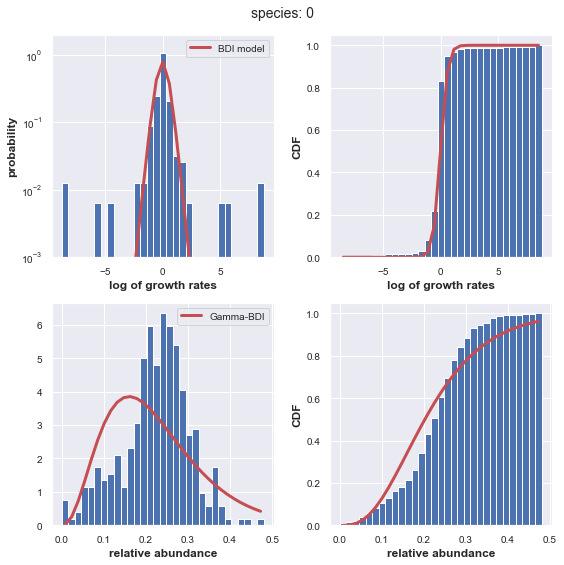

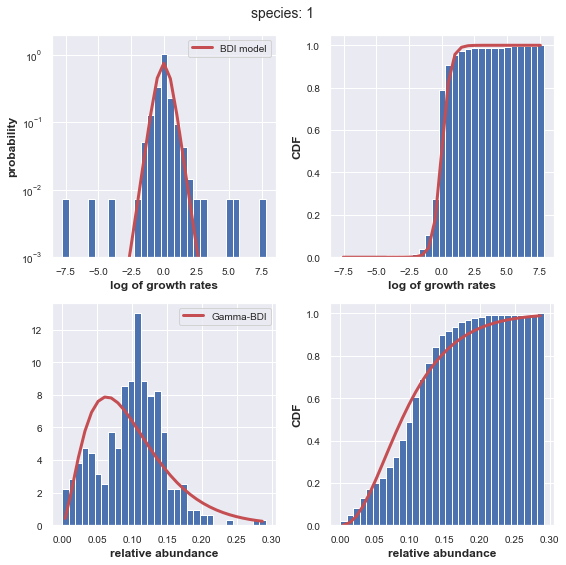

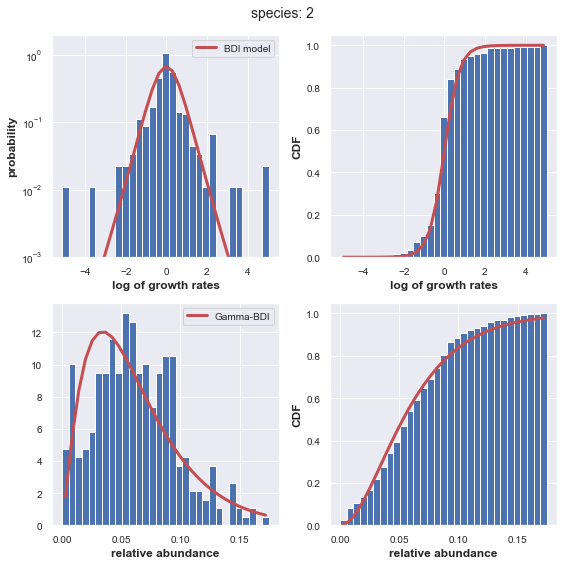

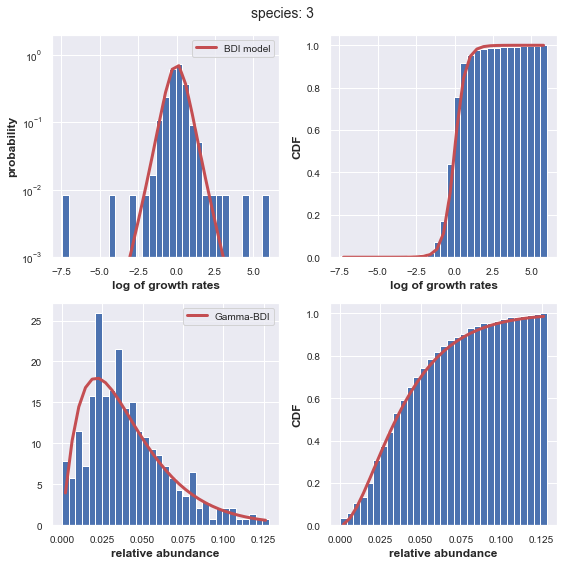

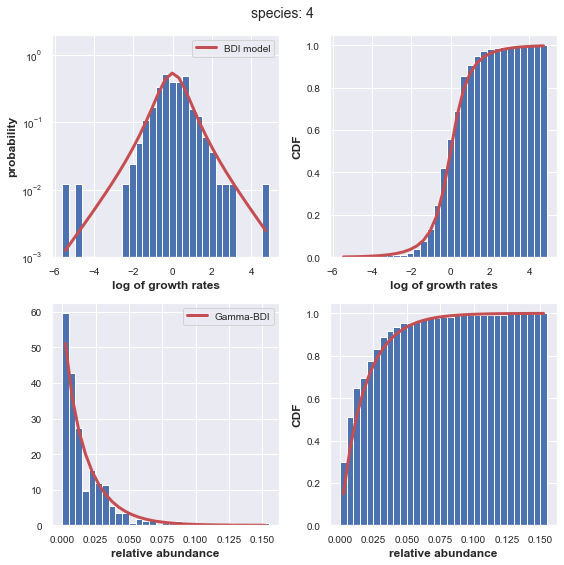

...

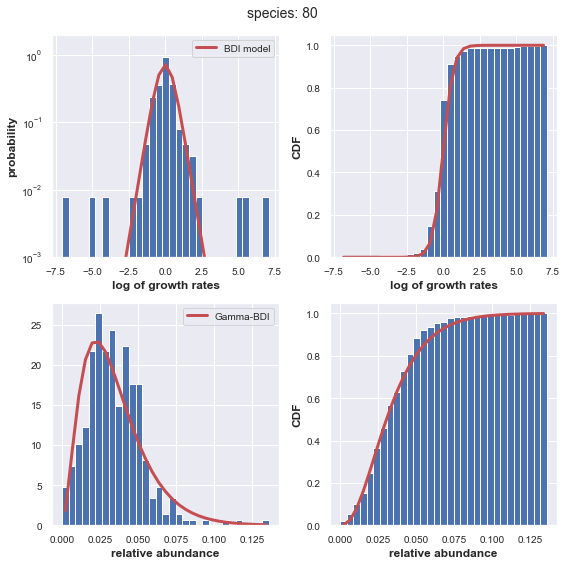

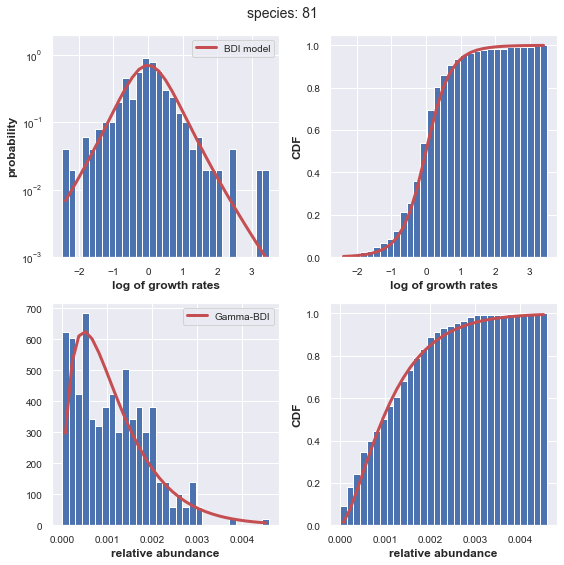

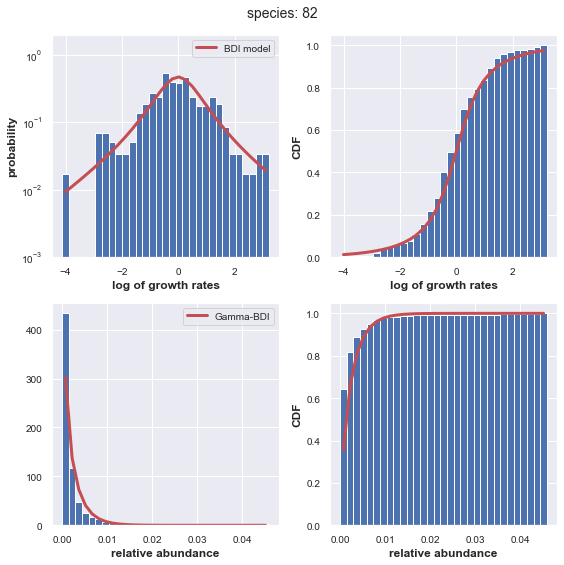

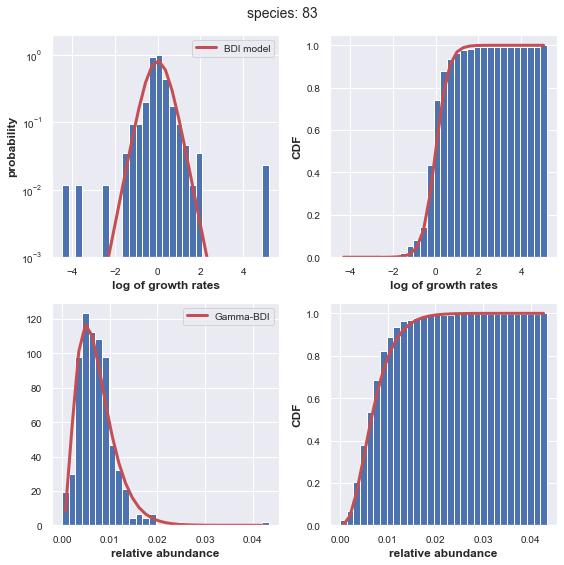

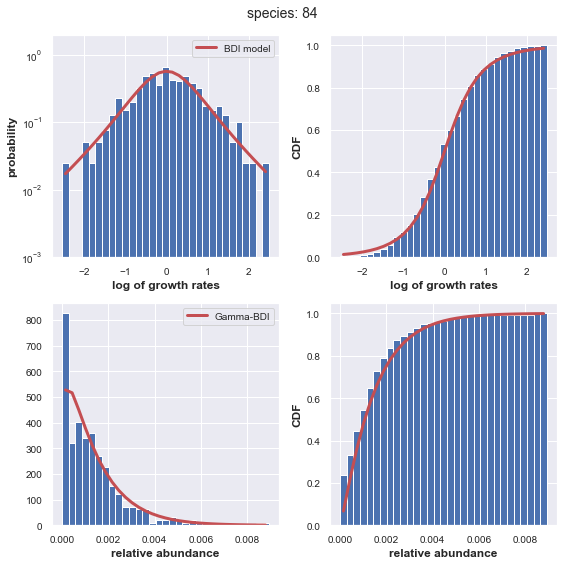

In [17]:
destfold='/Users/ashish/Box/research/James/microbiome data/microbiome_fits/'   
neutral_inst = shared_func.azaele_neutral_logG_distribution()
time_points=np.squeeze(caporaso['m3_days'])
rel_abu_t_mat_full=caporaso['m3_rel_abu']

sp_idxs=get_abundant_and_prevalent_species_idx(rel_abu_t_mat_full)
otu_abu_t_mat=rel_abu_t_mat_full[sp_idxs]

Delta_t=tau=1
idx_1_list=[]
idx_2_list=[]
for j,t2 in enumerate(time_points):
    if np.any(time_points==t2-tau):
        i=int(np.where(time_points==t2-tau)[0])
        t1=time_points[i]
#         print (i,j, t1, t2)
        idx_1_list.append(i)
        idx_2_list.append(j)
idxs_1=np.array(idx_1_list)
idxs_2=np.array(idx_2_list)
# print (len(idxs_1))
# otu_t2=np.ravel(otu_abu_t_mat[:,idxs_2])
# otu_t1=np.ravel(otu_abu_t_mat[:,idxs_1])


# idx_nonzero=np.intersect1d(np.nonzer)


results_fit={'m/D_AFD':[],'tp':[], 'Dtau':[]}   
for sp in range(len(otu_abu_t_mat)):
    
    otu_t2=np.ravel(otu_abu_t_mat[sp,idxs_2])
    otu_t1=np.ravel(otu_abu_t_mat[sp,idxs_1])
    idx_non0=np.intersect1d(np.nonzero(otu_t2), np.nonzero(otu_t1))
    growth_rates=otu_t2[idx_non0]/otu_t1[idx_non0]
    log_g=np.log(growth_rates)
    
    
    otu_abu=otu_abu_t_mat[sp,:]
    a_gamma,dummy_loc_gamma, scale_gamma=scipy.stats.gamma.fit(
                            otu_abu[otu_abu>0], 1.,floc=0.,scale=2 )
    
    
    
    neut_tp, neut_bd, loc_neut, scale_neut = neutral_inst.fit(
        log_g,10., fbd= a_gamma, floc=0,fscale=1.)
    
    results_fit['m/D_AFD'].append(a_gamma)
    results_fit['tp'].append(neut_tp)
    results_fit['Dtau'].append(scale_gamma)

    
    fig = plt.figure(figsize=(8, 8))
    ax1 = fig.add_subplot(2,2,1)
    

    n_bins=31
    histogram, bins = np.histogram(log_g, bins=n_bins, density=True)
    bin_centers = 0.5*(bins[1:] + bins[:-1])
    ax1.hist(log_g, bins=n_bins, density=True)
#     ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu_laplace,scale=scale_laplace),
#                      'c-',lw=3,label='Laplace')
    ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut),
             'r-',lw=3,label='BDI model') 
    
    ax1.legend(loc='best')
    ax1.set_yscale('log')
    ax1.set_ylim(1e-3,2.)
    ax1.set_xlabel('log of growth rates')   
    ax1.set_ylabel('probability')
    ax2 = fig.add_subplot(2,2,2)

    bin_width=np.mean(np.diff(bin_centers))
#     ax2.plot(bin_centers, np.cumsum(histogram)*bin_width,'b-o')
    ax2.bar(bin_centers, np.cumsum(histogram)*bin_width, width=bin_width)
    ax2.plot(bin_centers, neutral_inst.cdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut)
             ,'r-', linewidth=3)
    ax2.set_xlabel('log of growth rates')   
    ax2.set_ylabel('CDF') 
    
    ax3 = fig.add_subplot(2,2,3)
    n_bins=31
    histogram, bins = np.histogram(otu_abu, bins=n_bins, density=True)
    bin_centers = 0.5*(bins[1:] + bins[:-1])
    ax3.hist(otu_abu, bins=n_bins, density=True)
    ax3.plot(bin_centers,scipy.stats.gamma.pdf(bin_centers, a_gamma,
                                               loc=0, scale= scale_gamma), 
                     'r-',label='Gamma-BDI', linewidth=3)
    
    ax3.legend(loc='best')
#     ax2.set_yscale('log')
    ax3.set_xlabel('relative abundance')
    plt.suptitle('species: '+str(sp))
    
    ax4 = fig.add_subplot(2,2,4)
    bin_width=np.mean(np.diff(bin_centers))
    ax4.bar(bin_centers, np.cumsum(histogram)*bin_width, width=bin_width)#,'b-o')
    ax4.plot(bin_centers, scipy.stats.gamma.cdf(bin_centers, a_gamma,
                                               loc=0, scale= scale_gamma),'r-', linewidth=3)
    ax4.set_xlabel('relative abundance')   
    ax4.set_ylabel('CDF') 
    
    
    plt.tight_layout()
#     plt.show()  
    plt.savefig(destfold+'fit_logG_with_AFD_k-Sp'+str(sp)+'.png')
#     if sp>0:
#         break
        
with open(destfold+'fit_logG_with_AFD_K-fitvals-tau_'+str(Delta_t)+'.pkl', 'wb') as handle:
    pickle.dump(results_fit, handle)      


Text(0.5, 0, '$D\\tau$')

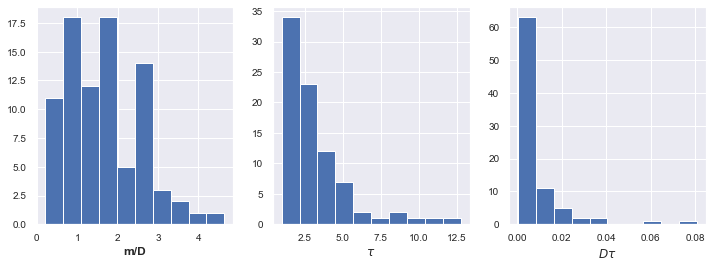

In [9]:
with open(destfold+'fit_logG_with_AFD_K-fitvals-tau_'+str(Delta_t)+'.pkl', 'rb') as handle:
    result_fit_vals = pickle.load(handle)
    
fig = plt.figure(figsize=(12, 4))
ax1 = fig.add_subplot(1,3,1)
ax2 = fig.add_subplot(1,3,2)
ax3 = fig.add_subplot(1,3,3)


ax1.hist(result_fit_vals['m/D_AFD'])
ax1.set_xlabel('m/D')
tau=Delta_t/np.array(result_fit_vals['tp'])
ax2.hist(tau[tau<200])# removing one outlier!
ax2.set_xlabel(r'$\tau$')
ax3.hist(result_fit_vals['Dtau'])
ax3.set_xlabel(r'$D\tau$')

In [21]:
np.min(result_fit_vals['Dtau'])

0.00041480114552819417

### k is more sharply distributed than tau or Dtau

Text(0.5, 0, '$D\\tau$')

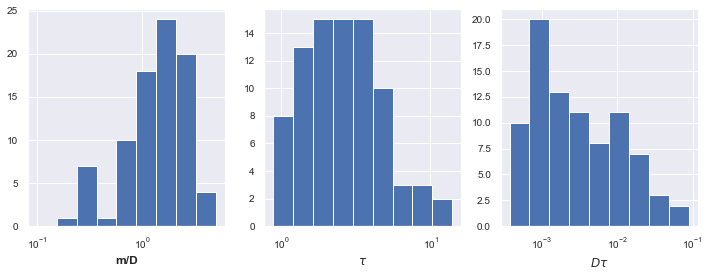

In [22]:
with open(destfold+'fit_logG_with_AFD_K-fitvals-tau_'+str(Delta_t)+'.pkl', 'rb') as handle:
    result_fit_vals = pickle.load(handle)
    
fig = plt.figure(figsize=(12, 4))
ax1 = fig.add_subplot(1,3,1)
ax2 = fig.add_subplot(1,3,2)
ax3 = fig.add_subplot(1,3,3)


# ax1.hist(result_fit_vals['m/D_AFD'])
ax1.hist(result_fit_vals['m/D_AFD'], bins=np.logspace(np.log10(0.1),np.log10(5.0), 10))
ax1.set_xlabel('m/D')
ax1.set_xscale('log')

tau=Delta_t/np.array(result_fit_vals['tp'])

ax2.hist(tau[tau<200], bins=np.logspace(np.log10(np.min(tau)*.9),np.log10(14), 10))# removing one outlier!
ax2.set_xscale('log')
ax2.set_xlabel(r'$\tau$')
ax3.hist(result_fit_vals['Dtau'],
        bins=np.logspace(np.log10(np.min(result_fit_vals['Dtau'])*.9),np.log10(np.max(result_fit_vals['Dtau'])*1.1), 10))
ax3.set_xscale('log')
ax3.set_xlabel(r'$D\tau$')

### Repeat for female F4 data

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]
/Users/ashish

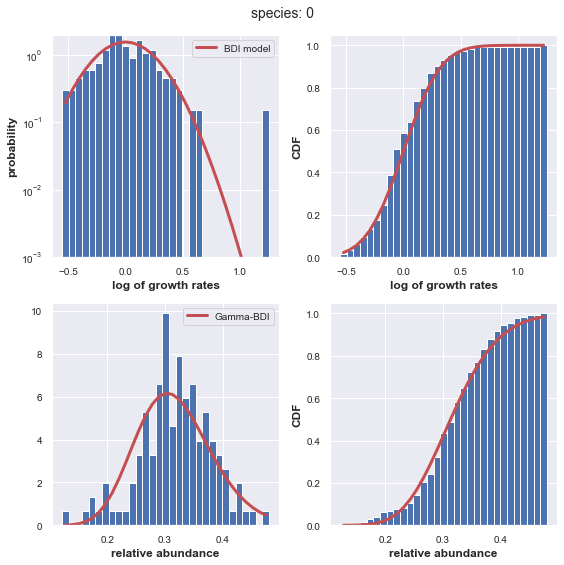

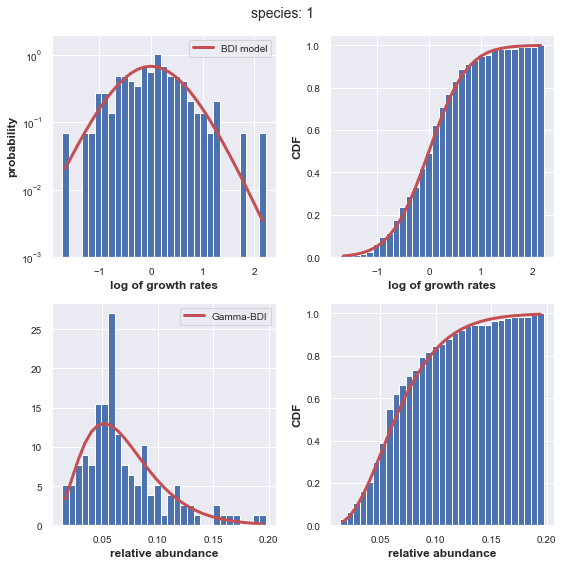

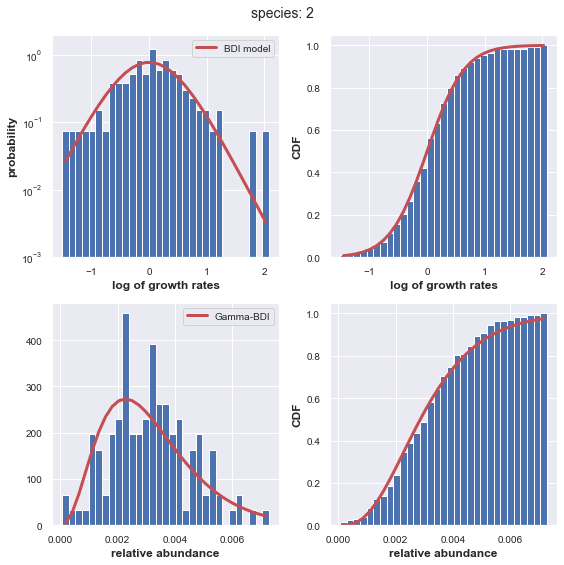

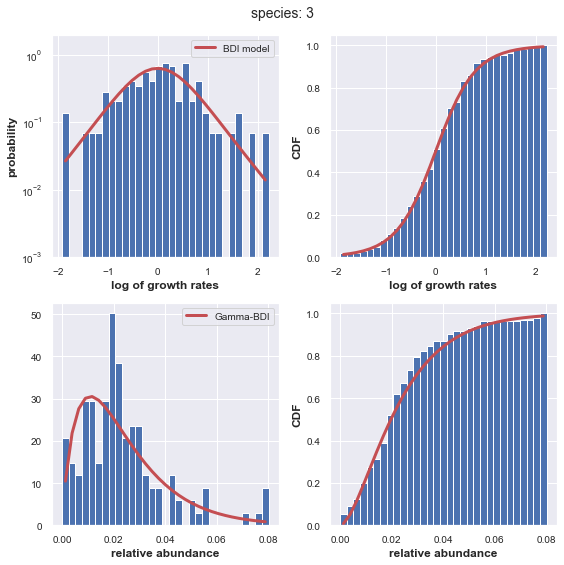

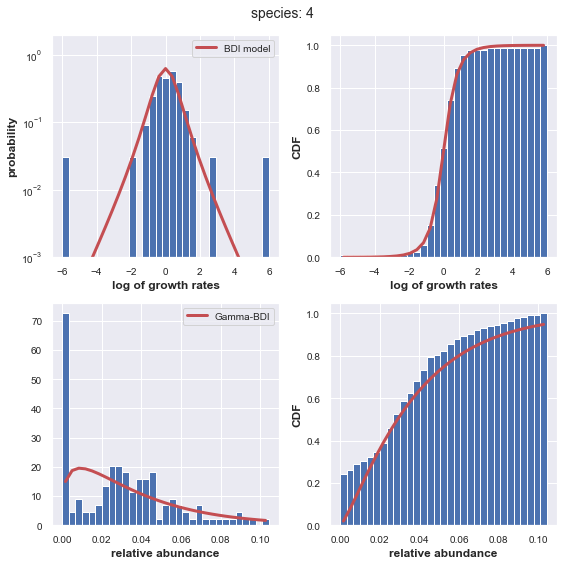

...

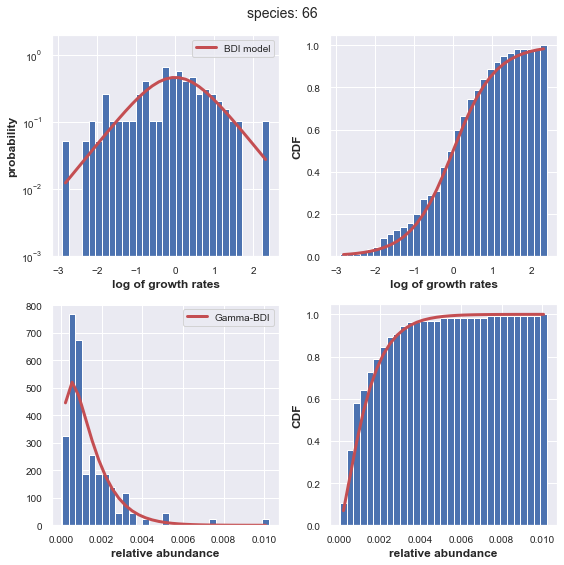

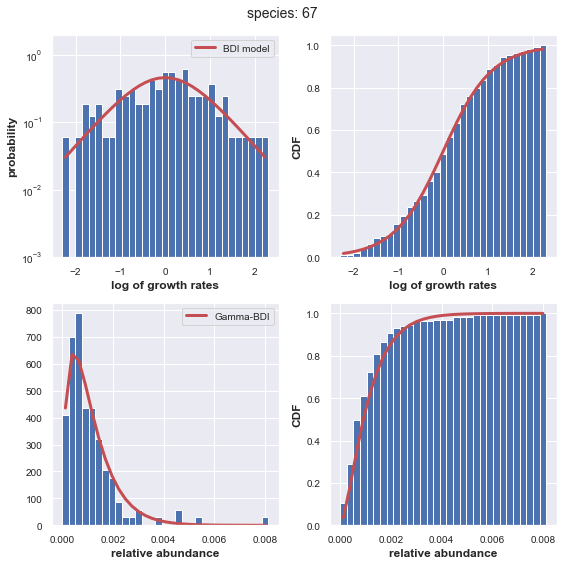

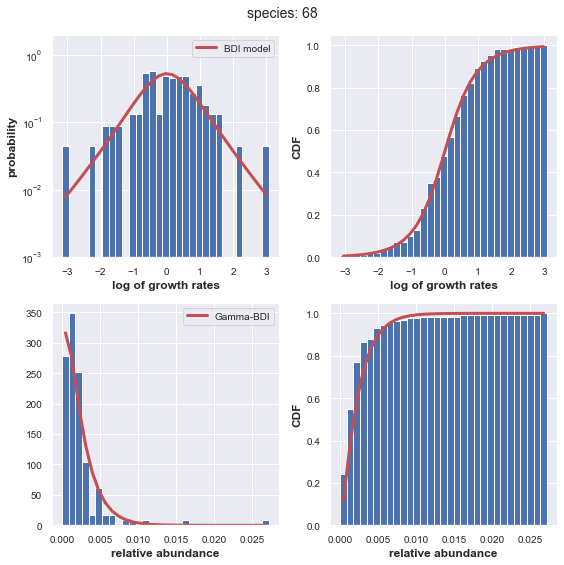

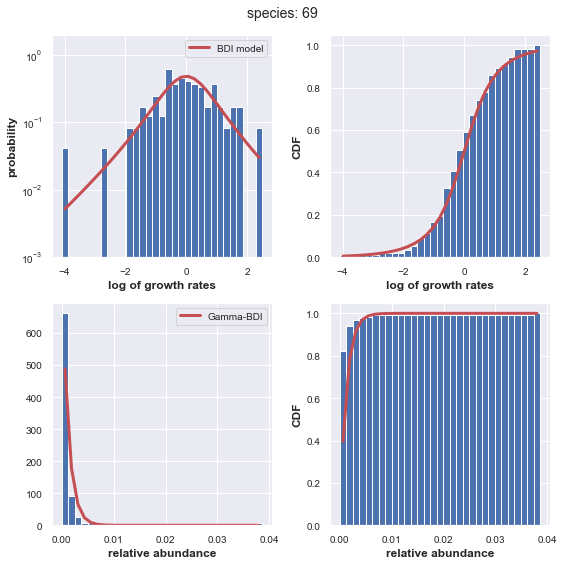

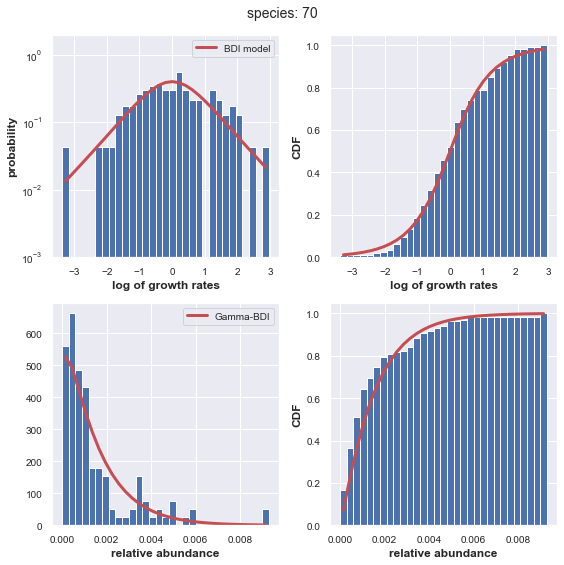

In [23]:
destfold='/Users/ashish/Box/research/James/microbiome data/microbiome_fits/'   
neutral_inst = shared_func.azaele_neutral_logG_distribution()
time_points=np.squeeze(caporaso['f4_days'])
rel_abu_t_mat_full=caporaso['f4_rel_abu']

sp_idxs=get_abundant_and_prevalent_species_idx(rel_abu_t_mat_full)
otu_abu_t_mat=rel_abu_t_mat_full[sp_idxs]

Delta_t=tau=1
idx_1_list=[]
idx_2_list=[]
for j,t2 in enumerate(time_points):
    if np.any(time_points==t2-tau):
        i=int(np.where(time_points==t2-tau)[0])
        t1=time_points[i]
#         print (i,j, t1, t2)
        idx_1_list.append(i)
        idx_2_list.append(j)
idxs_1=np.array(idx_1_list)
idxs_2=np.array(idx_2_list)
# print (len(idxs_1))
# otu_t2=np.ravel(otu_abu_t_mat[:,idxs_2])
# otu_t1=np.ravel(otu_abu_t_mat[:,idxs_1])


# idx_nonzero=np.intersect1d(np.nonzer)


results_fit={'m/D_AFD':[],'tp':[], 'Dtau':[]}   
for sp in range(len(otu_abu_t_mat)):
    
    otu_t2=np.ravel(otu_abu_t_mat[sp,idxs_2])
    otu_t1=np.ravel(otu_abu_t_mat[sp,idxs_1])
    idx_non0=np.intersect1d(np.nonzero(otu_t2), np.nonzero(otu_t1))
    growth_rates=otu_t2[idx_non0]/otu_t1[idx_non0]
    log_g=np.log(growth_rates)
    
    
    otu_abu=otu_abu_t_mat[sp,:]
    a_gamma,dummy_loc_gamma, scale_gamma=scipy.stats.gamma.fit(
                            otu_abu[otu_abu>0], 1.,floc=0.,scale=2 )
    
    
    
    neut_tp, neut_bd, loc_neut, scale_neut = neutral_inst.fit(
        log_g,10., fbd= a_gamma, floc=0,fscale=1.)
    
    results_fit['m/D_AFD'].append(a_gamma)
    results_fit['tp'].append(neut_tp)
    results_fit['Dtau'].append(scale_gamma)

    
    fig = plt.figure(figsize=(8, 8))
    ax1 = fig.add_subplot(2,2,1)
    

    n_bins=31
    histogram, bins = np.histogram(log_g, bins=n_bins, density=True)
    bin_centers = 0.5*(bins[1:] + bins[:-1])
    ax1.hist(log_g, bins=n_bins, density=True)
#     ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu_laplace,scale=scale_laplace),
#                      'c-',lw=3,label='Laplace')
    ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut),
             'r-',lw=3,label='BDI model') 
    
    ax1.legend(loc='best')
    ax1.set_yscale('log')
    ax1.set_ylim(1e-3,2.)
    ax1.set_xlabel('log of growth rates')   
    ax1.set_ylabel('probability')
    ax2 = fig.add_subplot(2,2,2)

    bin_width=np.mean(np.diff(bin_centers))
#     ax2.plot(bin_centers, np.cumsum(histogram)*bin_width,'b-o')
    ax2.bar(bin_centers, np.cumsum(histogram)*bin_width, width=bin_width)
    ax2.plot(bin_centers, neutral_inst.cdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut)
             ,'r-', linewidth=3)
    ax2.set_xlabel('log of growth rates')   
    ax2.set_ylabel('CDF') 
    
    ax3 = fig.add_subplot(2,2,3)
    n_bins=31
    histogram, bins = np.histogram(otu_abu, bins=n_bins, density=True)
    bin_centers = 0.5*(bins[1:] + bins[:-1])
    ax3.hist(otu_abu, bins=n_bins, density=True)
    ax3.plot(bin_centers,scipy.stats.gamma.pdf(bin_centers, a_gamma,
                                               loc=0, scale= scale_gamma), 
                     'r-',label='Gamma-BDI', linewidth=3)
    
    ax3.legend(loc='best')
#     ax2.set_yscale('log')
    ax3.set_xlabel('relative abundance')
    plt.suptitle('species: '+str(sp))
    
    ax4 = fig.add_subplot(2,2,4)
    bin_width=np.mean(np.diff(bin_centers))
    ax4.bar(bin_centers, np.cumsum(histogram)*bin_width, width=bin_width)#,'b-o')
    ax4.plot(bin_centers, scipy.stats.gamma.cdf(bin_centers, a_gamma,
                                               loc=0, scale= scale_gamma),'r-', linewidth=3)
    ax4.set_xlabel('relative abundance')   
    ax4.set_ylabel('CDF') 
    
    
    plt.tight_layout()
#     plt.show()  
    plt.savefig(destfold+'fit_logG_with_AFD_k_F4-Sp'+str(sp)+'.png')
#     if sp>0:
#         break
        
with open(destfold+'fit_logG_with_AFD_K-fitvals_F4-tau_'+str(Delta_t)+'.pkl', 'wb') as handle:
    pickle.dump(results_fit, handle)      


# Taylor's law

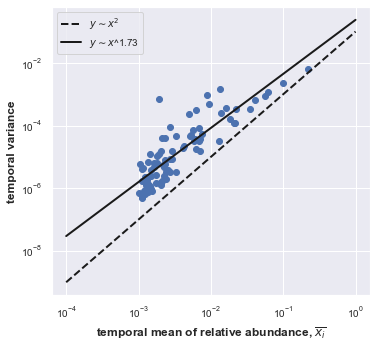

In [5]:
variance_list=[]
mean_list=[]

time_points=np.squeeze(caporaso['m3_days'])
rel_abu_t_mat_full=caporaso['m3_rel_abu']

sp_idxs=get_abundant_and_prevalent_species_idx(rel_abu_t_mat_full)
otu_abu_t_mat=rel_abu_t_mat_full[sp_idxs]

fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(1,2,1)

for sp in range(len(otu_abu_t_mat)):
#     ax1.plot(np.mean(otu_abu_t_mat[sp]), np.var(otu_abu_t_mat[sp]) )
    mean_list.append(np.mean(otu_abu_t_mat[sp]))
    variance_list.append(np.var(otu_abu_t_mat[sp]))
ax1.plot(mean_list,variance_list,'o')
    


fit_result = scipy.stats.linregress(np.log10(mean_list), np.log10(variance_list))
xdummy=np.linspace(1e-4, 1,5)                
ax1.plot(xdummy,.1*xdummy**2, 'k--', lw=2, label=r'$y \sim x^2$')

ax1.plot(xdummy,(10.**fit_result.intercept)*(xdummy**fit_result.slope), 'k-',
         lw=2, label=r'$y \sim x$^'+ '{:.2f}'.format(fit_result.slope))
# ax1.legend(loc='upper left',bbox_to_anchor=(1.04,1),ncol=2)     
ax1.legend(loc='best')
ax1.set_xlabel(r'temporal mean of relative abundance, $\overline{x_{i}}$')
ax1.set_ylabel(r'temporal variance')
ax1.set_xscale('log')
ax1.set_yscale('log')        
plt.tight_layout()
plt.show()

# rough

In [103]:
sp_idxs2=np.squeeze(np.where(caporaso['m3_shape_gamma_k']>2))
sp_idxs1=np.squeeze(np.where(caporaso['m3_shape_gamma_k']<3))

sp_idxs=np.intersect1d(sp_idxs1,sp_idxs2)
tau=1
print('tau=',tau)
# tau=1
# print('tau=',tau)
# plot_log_growth_dist(caporaso['m3_rel_abu'][sp_idxs], time_points, tau)
# plot_log_growth_dist(caporaso['m3_rel_abu'][sp_idxs], time_points, tau)
data_mat=caporaso['m3_rel_abu'][sp_idxs]
sp_idx=get_abundant_and_prevalent_species_idx(data_mat)
otu_abu_t_mat=data_mat[sp_idx]

## find time stampindexes that are one data apart
idx_1_list=[]
idx_2_list=[]
for j,t2 in enumerate(time_points):
    if np.any(time_points==t2-tau):
        i=int(np.where(time_points==t2-tau)[0])
        t1=time_points[i]
#         print (i,j, t1, t2)
        idx_1_list.append(i)
        idx_2_list.append(j)
idxs_1=np.array(idx_1_list)
idxs_2=np.array(idx_2_list)
print (len(idxs_1))
otu_t2=np.ravel(otu_abu_t_mat[:,idxs_2])
otu_t1=np.ravel(otu_abu_t_mat[:,idxs_1])
idx_non0=np.intersect1d(np.nonzero(otu_t2), np.nonzero(otu_t1))

# idx_nonzero=np.intersect1d(np.nonzer)
growth_rates=otu_t2[idx_non0]/otu_t1[idx_non0]
log_g=np.log(growth_rates)

neutral_inst = shared_func.azaele_neutral_logG_distribution()
neut_tp, neut_bd, loc_neut, scale_neut = neutral_inst.fit(
    log_g,10., 1., floc=0,fscale=1.) 


print (' neut_tp, neut_bd=',  neut_tp, neut_bd)
fig = plt.figure(figsize=(6, 6))
ax1 = fig.add_subplot()

n_bins=31
histogram, bins = np.histogram(log_g, bins=n_bins, density=True)
bin_centers = 0.5*(bins[1:] + bins[:-1])


ax1.hist(log_g, bins=n_bins, density=True)
# ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu_laplace,scale=scale_laplace),
#                  'c-',lw=3,label='Laplace')
ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut),
         'r-',lw=3,label='BDI model') 

ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, 0.4, 2.1, loc=loc_neut,scale= scale_neut),
         'c-',lw=3,label='tp=.3, bd=2.2') 


ax1.legend(loc='best')
ax1.set_yscale('log')
ax1.set_xlabel('log of growth rates')                                                 
plt.show()


tau= 1
277


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1837: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  return integrate.quad(self._pdf, _a, x, args=args)[0]


 neut_tp, neut_bd= 0.11983457625404581 1.0807283896037183


 neut_tp, neut_bd= 0.11983457625404581 1.0807283896037183


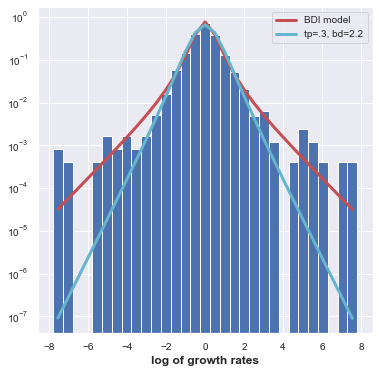

In [102]:
print (' neut_tp, neut_bd=',  neut_tp, neut_bd)


# exploring Azaele distribution parameter sensitivities

the time scale doesn't matter much for the log growth distribution
the shape, b/d, matters a lot for the log-growth distribution

In [ ]:
##    
sp_idx=get_abundant_and_prevalent_species_idx(otu_abu_t_mat_full)
otu_abu_t_mat=otu_abu_t_mat_full[sp_idx]

## find time stampindexes that are one data apart
idx_1_list=[]
idx_2_list=[]
for j,t2 in enumerate(time_points):
    if np.any(time_points==t2-tau):
        i=int(np.where(time_points==t2-tau)[0])
        t1=time_points[i]
#         print (i,j, t1, t2)
        idx_1_list.append(i)
        idx_2_list.append(j)
idxs_1=np.array(idx_1_list)
idxs_2=np.array(idx_2_list)
print (len(idxs_1))
otu_t2=np.ravel(otu_abu_t_mat[:,idxs_2])
otu_t1=np.ravel(otu_abu_t_mat[:,idxs_1])
idx_non0=np.intersect1d(np.nonzero(otu_t2), np.nonzero(otu_t1))

# idx_nonzero=np.intersect1d(np.nonzer)
growth_rates=otu_t2[idx_non0]/otu_t1[idx_non0]
log_g=np.log(growth_rates)

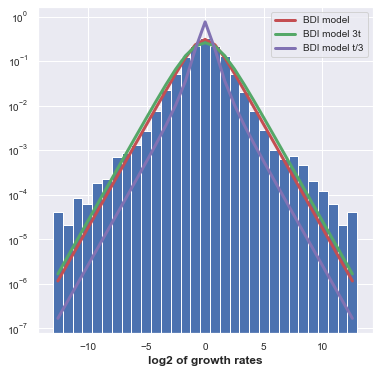

In [37]:
fig = plt.figure(figsize=(6, 6))
ax1 = fig.add_subplot()
# ax2 = fig.add_subplot(1,2,2)

ax1.hist(log_g, bins=n_bins, density=True)
# ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu_laplace,scale=scale_laplace),
#                  'c-',lw=3,label='Laplace')
ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut),
         'r-',lw=3,label='BDI model') 

ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp*10, neut_bd, loc=loc_neut,scale= scale_neut),
         'g-',lw=3,label='BDI model 10t') 

ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp/10, neut_bd, loc=loc_neut,scale= scale_neut),
         'm-',lw=3,label='BDI model t/10') 

ax1.legend(loc='best')
ax1.set_yscale('log')
ax1.set_xlabel('log2 of growth rates')                                                 
plt.show()


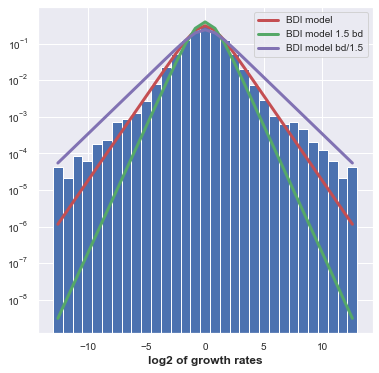

In [41]:
fig = plt.figure(figsize=(6, 6))
ax1 = fig.add_subplot()
# ax2 = fig.add_subplot(1,2,2)

ax1.hist(log_g, bins=n_bins, density=True)
# ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu_laplace,scale=scale_laplace),
#                  'c-',lw=3,label='Laplace')
ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut),
         'r-',lw=3,label='BDI model') 

ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd*1.5, loc=loc_neut,scale= scale_neut),
         'g-',lw=3,label='BDI model 1.5 bd') 

ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd/1.5, loc=loc_neut,scale= scale_neut),
         'm-',lw=3,label='BDI model bd/1.5') 

ax1.legend(loc='best')
ax1.set_yscale('log')
ax1.set_xlabel('log2 of growth rates')                                                 
plt.show()

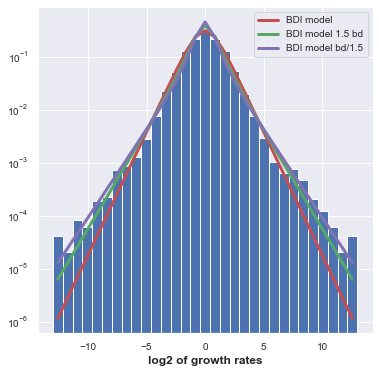

AICs:
211199.81277532032
213124.43166557615
216004.94354971542


In [53]:
fig = plt.figure(figsize=(6, 6))
ax1 = fig.add_subplot()
# ax2 = fig.add_subplot(1,2,2)

ax1.hist(log_g, bins=n_bins, density=True)
# ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu_laplace,scale=scale_laplace),
#                  'c-',lw=3,label='Laplace')
ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp, neut_bd, loc=loc_neut,scale= scale_neut),
         'r-',lw=3,label='BDI model') 

ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp/3, neut_bd/1.25, loc=loc_neut,scale= scale_neut),
         'g-',lw=3,label='BDI model 1.5 bd') 

ax1.plot(bin_centers, neutral_inst.pdf(bin_centers, neut_tp/5, neut_bd/1.4, loc=loc_neut,scale= scale_neut),
         'm-',lw=3,label='BDI model bd/1.5') 

ax1.legend(loc='best')
ax1.set_yscale('log')
ax1.set_xlabel('log2 of growth rates')                                                 
plt.show()

print ('AICs:')
print (2*2-2*np.sum(neutral_inst.logpdf(log_g, neut_tp, neut_bd, 
                                        loc=loc_neut,scale= scale_neut)))
       
print (2*2-2*np.sum(neutral_inst.logpdf(log_g,  neut_tp/3, 
                                        neut_bd/1.25, loc=loc_neut,scale= scale_neut)))       
print (2*2-2*np.sum(neutral_inst.logpdf(log_g,   neut_tp/5, neut_bd/1.4, 
                                        loc=loc_neut,scale= scale_neut)))       
  
